# Carga de Modelos

En esta seccion se cargaran los modelos con los pesos despues del entrenamiento
Este entrenamiento puede verse en el notebook "Guardado_de_modelos"

In [21]:
#librerias
import random
import time
import copy
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models

from sklearn.metrics import classification_report, confusion_matrix, f1_score

plt.style.use('seaborn-v0_8')

from PIL import Image
import os
import glob

In [26]:
# Librerías de explicabilidad (Grad-CAM)
from pytorch_grad_cam import GradCAM, GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

## Metricas y Datos

se guardan los modulos para visualizar metricas y manipulacion de datos

In [3]:
def seed_everything(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(42)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Dispositivo:', device)

Dispositivo: cpu


In [4]:
DATA_DIR = Path("Dog's skin diseases-Kaggle_v_corta")
assert DATA_DIR.exists(), f'No se encontro la carpeta: {DATA_DIR.resolve()}'

IMG_SIZE = 224
BATCH_SIZE = 32
NUM_WORKERS = 0

train_tfms = transforms.Compose([
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.8, 1.0)),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomRotation(8),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

eval_tfms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

datasets_map = {
    'train': datasets.ImageFolder(DATA_DIR / 'train', transform=train_tfms),
    'valid': datasets.ImageFolder(DATA_DIR / 'valid', transform=eval_tfms),
    'test': datasets.ImageFolder(DATA_DIR / 'test', transform=eval_tfms),
}

dataloaders = {
    split: DataLoader(
        ds,
        batch_size=BATCH_SIZE,
        shuffle=(split == 'train'),
        num_workers=NUM_WORKERS,
        pin_memory=(device.type == 'cuda')
    )
    for split, ds in datasets_map.items()
}

class_names = datasets_map['train'].classes
num_classes = len(class_names)

print('Clases:', class_names)
print('Tamano train/valid/test:', len(datasets_map['train']), len(datasets_map['valid']), len(datasets_map['test']))

Clases: ['Demodicosis', 'Dermatitis', 'Fungal_infections', 'Healthy', 'Hypersensitivity', 'Ringworm']
Tamano train/valid/test: 1258 370 183


In [5]:
targets = np.array(datasets_map['train'].targets)
class_counts = np.bincount(targets, minlength=num_classes)
class_weights = class_counts.sum() / (num_classes * class_counts)
class_weights = torch.tensor(class_weights, dtype=torch.float32, device=device)

for i, c in enumerate(class_names):
    print(f'{c}: n={class_counts[i]}, weight={class_weights[i].item():.4f}')

Demodicosis: n=210, weight=0.9984
Dermatitis: n=210, weight=0.9984
Fungal_infections: n=210, weight=0.9984
Healthy: n=204, weight=1.0278
Hypersensitivity: n=210, weight=0.9984
Ringworm: n=214, weight=0.9798


In [6]:
#graficas de las metricas del modelo
def plot_history(history):
    epochs = range(1, len(history['train_loss']) + 1)

    fig, axes = plt.subplots(1, 3, figsize=(16, 4))

    axes[0].plot(epochs, history['train_loss'], label='train')
    axes[0].plot(epochs, history['valid_loss'], label='valid')
    axes[0].set_title('Loss')
    axes[0].legend()

    axes[1].plot(epochs, history['train_acc'], label='train')
    axes[1].plot(epochs, history['valid_acc'], label='valid')
    axes[1].set_title('Accuracy')
    axes[1].legend()

    axes[2].plot(epochs, history['train_f1'], label='train')
    axes[2].plot(epochs, history['valid_f1'], label='valid')
    axes[2].set_title('Macro-F1')
    axes[2].legend()

    plt.tight_layout()
    plt.show()

In [7]:
@torch.no_grad()
def predict_loader(model, loader):
    model.eval()
    preds, targets = [], []
    for images, labels in loader:
        images = images.to(device, non_blocking=True)
        logits = model(images)
        pred = logits.argmax(dim=1).cpu().numpy()
        preds.extend(pred.tolist())
        targets.extend(labels.numpy().tolist())
    return np.array(preds), np.array(targets)

def predicts(model):
    test_preds, test_targets = predict_loader(model, dataloaders['test'])
    test_acc = (test_preds == test_targets).mean()
    test_f1 = f1_score(test_targets, test_preds, average='macro')

    print(f'Test accuracy: {test_acc:.4f}')
    print(f'Test macro-F1: {test_f1:.4f}')
    print('\nClassification report (test):')
    print(classification_report(test_targets, test_preds, target_names=class_names))

    return test_preds, test_targets


def matriz_confusion(test_targets, test_preds):
    cm = confusion_matrix(test_targets, test_preds)
    fig, ax = plt.subplots(figsize=(6, 5))
    im = ax.imshow(cm, cmap='Blues')
    ax.set_xticks(range(num_classes))
    ax.set_yticks(range(num_classes))
    ax.set_xticklabels(class_names, rotation=45, ha='right')
    ax.set_yticklabels(class_names)
    ax.set_xlabel('Prediccion')
    ax.set_ylabel('Real')
    ax.set_title('Matriz de confusion - Test')

    for i in range(num_classes):
        for j in range(num_classes):
            ax.text(j, i, cm[i, j], ha='center', va='center', color='black')

    fig.colorbar(im, ax=ax)
    plt.tight_layout()
    plt.show()

In [19]:
def imagenes_aleatorias(n):
    imagenes_A = []
    for i in range(n):
        carpeta_base = "Dog's skin diseases-Kaggle_v_corta/test"

        # Definir patrones para múltiples extensiones
        # El operador ** busca recursivamente en todos los subdirectorios
        patrones = [
            os.path.join(carpeta_base, '**/*.jpg'),
            os.path.join(carpeta_base, '**/*.jpeg'),
            os.path.join(carpeta_base, '**/*.png'),
            os.path.join(carpeta_base, '**/*.bmp')
        ]

        # Recopilar todas las rutas de imágenes en una sola lista
        # Usamos set() para evitar duplicados si hubiera coincidencias extrañas
        todas_las_imagenes = []
        for patron in patrones:
            todas_las_imagenes.extend(glob.glob(patron, recursive=True))

        if not todas_las_imagenes:
            raise FileNotFoundError("No se encontraron imágenes en la carpeta ni en sus subcarpetas.")

        # Elegir una al azar
        ruta_elegida = random.choice(todas_las_imagenes)
        imagenes_A.append(ruta_elegida)
    return imagenes_A    

In [23]:
def build_input_from_pil(pil_img: Image.Image):
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225],
        ),
    ])

    rgb_img = np.array(pil_img.resize((224, 224)), dtype=np.float32) / 255.0
    input_tensor = transform(pil_img).unsqueeze(0)
    return rgb_img, input_tensor
def mostrar_imagens(n,model):
    im_A = imagenes_aleatorias(n)
    fig, axes = plt.subplots(1, n, figsize=(24, 6))

    for i in range(n):
        pil_img_full = Image.open(Path(im_A[i])).convert("RGB")
        rgb_img, input_tensor = build_input_from_pil(pil_img_full)
        input_tensor = input_tensor.to(device)
        
        with torch.no_grad():
            logits = model(input_tensor)
            probs = torch.softmax(logits, dim=1)
            pred_class_idx = int(torch.argmax(probs, dim=1).item())
            pred_conf = float(probs[0, pred_class_idx].item())

        pred_class_name = class_names[pred_class_idx]
        targets = [ClassifierOutputTarget(pred_class_idx)]

        axes[i].imshow(pil_img_full)
        axes[i].set_title(f"Imagen {i} \n {pred_class_name} \n {pred_conf*100:.2f}%")
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()
    print(im_A)

### Para GradCam

In [49]:
import matplotlib.pyplot as plt
def Grad_Cam(model,k):
    #K = numero de imagenes de muestra

    imagenes = imagenes_aleatorias(k)
    for i in range(k):
        #A = Path(imagenes[k])
        print(f"Imagen usada: {imagenes[i]}")
        pil_img_full = Image.open(Path(imagenes[i])).convert("RGB")
        rgb_img, input_tensor = build_input_from_pil(pil_img_full)
        input_tensor = input_tensor.to(device)

        class_names = ['Demodicosis', 'Dermatitis', 'Fungal_infections', 'Healthy', 'Hypersensitivity', 'Ringworm']

        model.eval()
        
        with torch.no_grad():
            logits = model(input_tensor)
            probs = torch.softmax(logits, dim=1)
            pred_class_idx = int(torch.argmax(probs, dim=1).item())
            pred_conf = float(probs[0, pred_class_idx].item())

        pred_class_name = class_names[pred_class_idx]
        targets = [ClassifierOutputTarget(pred_class_idx)]

        print(f"Clase predicha: {pred_class_name} ({pred_conf*100:.2f}%)")
        




        # 1. Instanciar los objetos Grad-CAM++ para cada capa (añadiendo layer4)
        cam_layer4 = GradCAMPlusPlus(model=model, target_layers=[model.features[-1]])
        cam_layer3 = GradCAMPlusPlus(model=model, target_layers=[model.features[-2]])
        cam_layer2 = GradCAMPlusPlus(model=model, target_layers=[model.features[-3]])

        # 2. Calcular las activaciones con suavizado
        cam_gcpp_l4 = cam_layer4(
            input_tensor=input_tensor,
            targets=targets,
            aug_smooth=True,
            eigen_smooth=True,
        )[0, :]

        cam_gcpp_l3 = cam_layer3(
            input_tensor=input_tensor,
            targets=targets,
            aug_smooth=True,
            eigen_smooth=True,
        )[0, :]

        cam_gcpp_l2 = cam_layer2(
            input_tensor=input_tensor,
            targets=targets,
            aug_smooth=True,
            eigen_smooth=True,
        )[0, :]

        # 3. Mezclar los mapas de calor con la imagen original en formato RGB
        vis_l4 = show_cam_on_image(rgb_img, cam_gcpp_l4, use_rgb=True)
        vis_l3 = show_cam_on_image(rgb_img, cam_gcpp_l3, use_rgb=True)
        vis_l2 = show_cam_on_image(rgb_img, cam_gcpp_l2, use_rgb=True)

        # 4. Configurar el plot (Cambiamos a 1 fila y 4 columnas, ajustando el figsize)
        fig, axes = plt.subplots(1, 4, figsize=(24, 6))

        # Columna 0: Entrada original
        axes[0].imshow(pil_img_full)
        axes[0].set_title("Imagen completa")
        axes[0].axis('off')

        # Columna 1: Características de nivel medio
        axes[1].imshow(vis_l2)
        axes[1].set_title("Grad-CAM++ layer2")
        axes[1].axis('off')

        # Columna 2: Características de nivel alto / semántico
        axes[2].imshow(vis_l3)
        axes[2].set_title("Grad-CAM++ layer3")
        axes[2].axis('off')

        # Columna 3: Características finales + Clasificación (Capa más profunda)
        axes[3].imshow(vis_l4)
        axes[3].set_title(f"Grad-CAM++ layer4 | {pred_class_name} ({pred_conf*100:.2f}%)")
        axes[3].axis('off')

        plt.tight_layout()
        plt.show()

## EfficientNEt_B0

In [10]:
def carga_efficientnet_b0(num_classes):
    model = models.efficientnet_b0(pretrained=False)
    in_features = model.classifier[-1].in_features
    model.classifier[-1] = nn.Linear(in_features, num_classes)
    pesos = torch.load('models/model_EfficientNet_15_epochs.pth', map_location=torch.device('cpu'))
    model.load_state_dict(pesos)

    return model

EfficientNet_Entrenado= carga_efficientnet_b0(6).to(device)

Datos del Modelo EfficientNet
Test accuracy: 0.8087
Test macro-F1: 0.8066

Classification report (test):
                   precision    recall  f1-score   support

      Demodicosis       0.90      0.87      0.89        31
       Dermatitis       0.88      0.68      0.76        31
Fungal_infections       0.74      0.79      0.77        29
          Healthy       0.86      0.97      0.91        31
 Hypersensitivity       0.69      0.76      0.72        29
         Ringworm       0.81      0.78      0.79        32

         accuracy                           0.81       183
        macro avg       0.81      0.81      0.81       183
     weighted avg       0.81      0.81      0.81       183



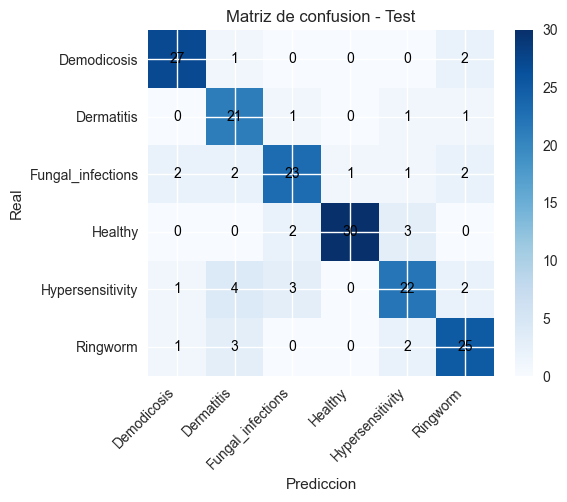

In [15]:
# Se muestran los resultados del modelo
print("Datos del Modelo EfficientNet")
test_preds_EF, test_targets_EF = predicts(EfficientNet_Entrenado)
matriz_confusion(test_preds_EF, test_targets_EF)

In [28]:
#mostrar_imagens(4,EfficientNet_Entrenado)

## MobileNet_V3

In [13]:
def carga_mobilenet_V3(num_classes):
    model = models.mobilenet_v3_small(pretrained=False)
    in_features = model.classifier[-1].in_features
    model.classifier[-1] = nn.Linear(in_features, num_classes)
    pesos = torch.load('models/mobilenet_v3_12_epochs.pth', map_location=torch.device('cpu'))
    model.load_state_dict(pesos)

    return model

MobileNet_Entrenado= carga_mobilenet_V3(6).to(device)

Datos del Modelo MobileNet_V3
Test accuracy: 0.7978
Test macro-F1: 0.7992

Classification report (test):
                   precision    recall  f1-score   support

      Demodicosis       0.86      0.81      0.83        31
       Dermatitis       0.85      0.71      0.77        31
Fungal_infections       0.61      0.79      0.69        29
          Healthy       0.87      0.84      0.85        31
 Hypersensitivity       0.77      0.79      0.78        29
         Ringworm       0.90      0.84      0.87        32

         accuracy                           0.80       183
        macro avg       0.81      0.80      0.80       183
     weighted avg       0.81      0.80      0.80       183



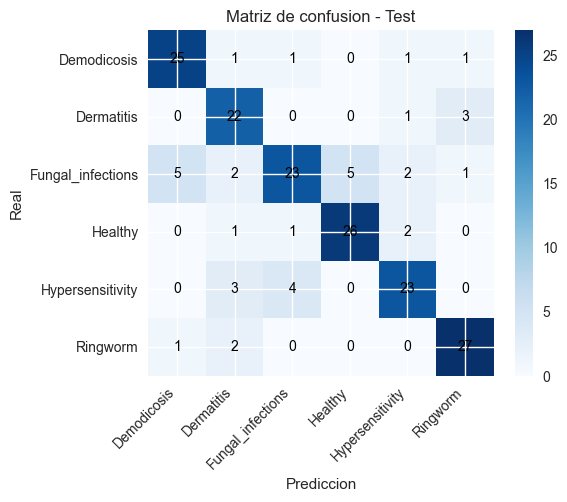

In [16]:
# Se muestran los resultados del modelo
print("Datos del Modelo MobileNet_V3")
test_preds_Mo, test_targets_Mo = predicts(MobileNet_Entrenado)
matriz_confusion(test_preds_Mo, test_targets_Mo)

## GradCam

## Visualizacion con GradCam del modelo EfficientNet_B0

se mostraran 3 imagenes junto a su prediccion y sus mapas de calor

Imagen usada: Dog's skin diseases-Kaggle_v_corta/test\Dermatitis\May-is-allergy-awareness-month-here-at-The-Shot-Spot_01453_jpg.rf.ea8f80519d77602e24b66c3e21978f88.jpg
Clase predicha: Dermatitis (31.25%)


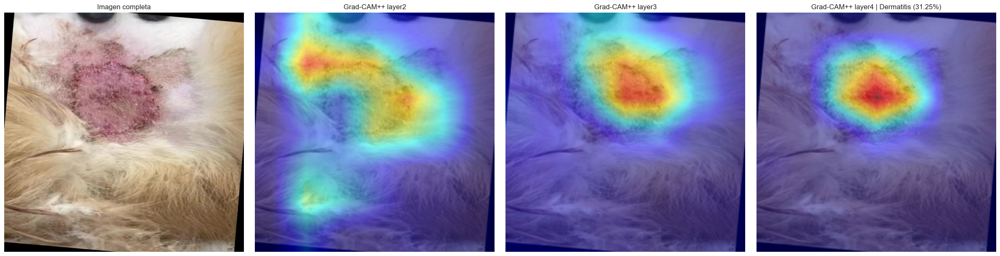

Imagen usada: Dog's skin diseases-Kaggle_v_corta/test\Hypersensitivity\B9781416056638000070_f007-004-9781416056638_jpg.rf.9c6126d4500d537def0ed601fcd4b84d.jpg
Clase predicha: Hypersensitivity (42.11%)


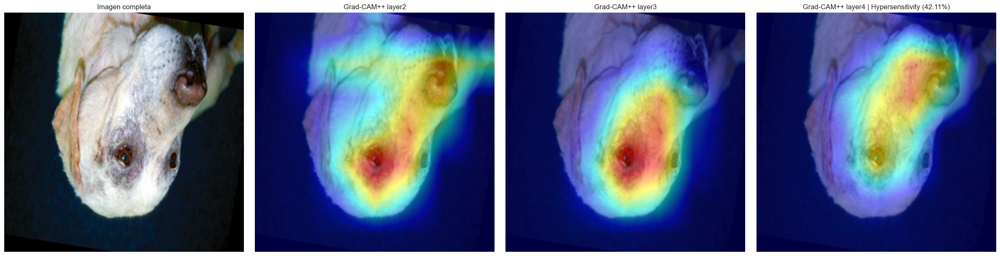

Imagen usada: Dog's skin diseases-Kaggle_v_corta/test\Ringworm\436627664_402183386034908_3493737909200169023_n_jpg.rf.b5272f6288bd2a1c77ef69fba03bd782.jpg
Clase predicha: Ringworm (86.70%)


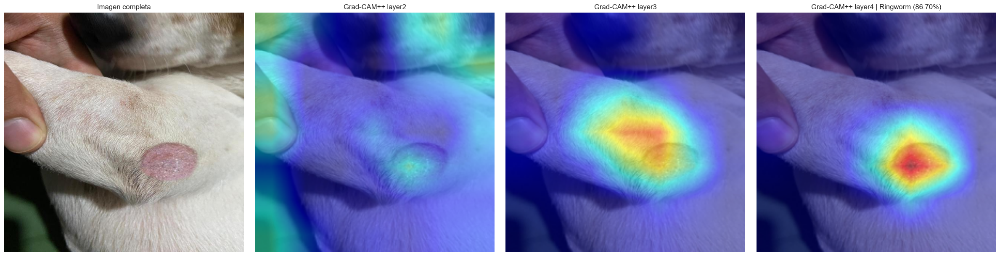

In [50]:
Grad_Cam(EfficientNet_Entrenado,3)

## Visualizacion con GradCam del modelo MobileNet_V3

se mostraran 3 imagenes junto a su prediccion y sus mapas de calor

Imagen usada: Dog's skin diseases-Kaggle_v_corta/test\Demodicosis\1-44-_png_jpg.rf.4d021276893f273a628c0078a2801dd2.jpg
Clase predicha: Demodicosis (65.62%)


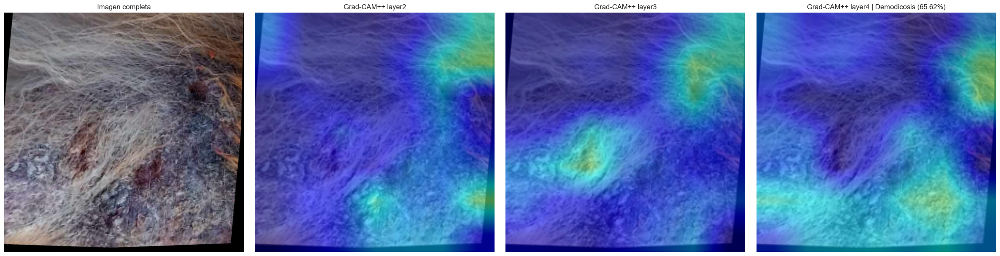

Imagen usada: Dog's skin diseases-Kaggle_v_corta/test\Hypersensitivity\Hypersensitivity4_png_jpg.rf.20bc0e0541eb1540023e0e6b4c5c84d3.jpg
Clase predicha: Hypersensitivity (38.97%)


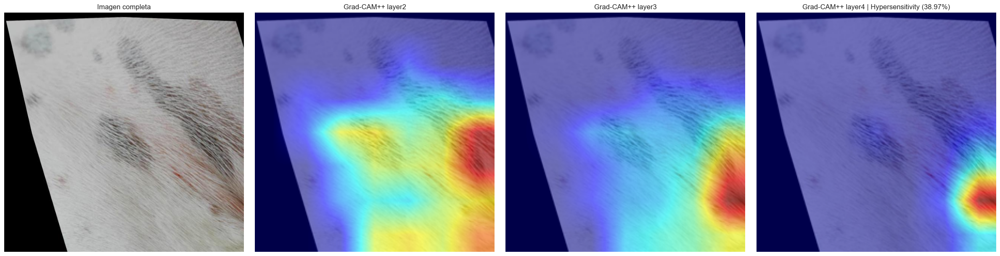

Imagen usada: Dog's skin diseases-Kaggle_v_corta/test\Dermatitis\hot-spots-suck_00100_jpg.rf.cfcf59bc6d89baf76ed0d17620214796.jpg
Clase predicha: Dermatitis (71.01%)


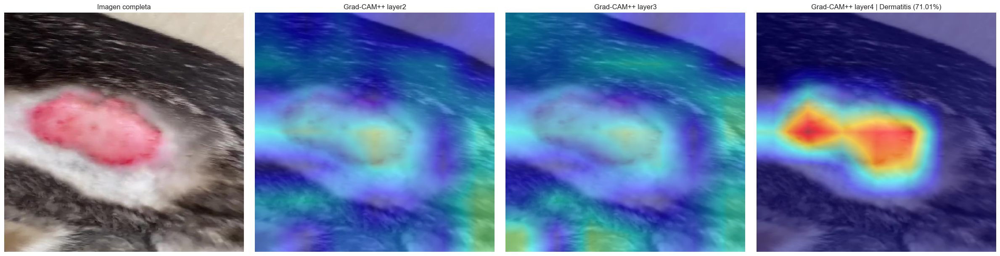

In [51]:
Grad_Cam(MobileNet_Entrenado,3)